In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
#custom functions
import os, sys
sys.path.insert(0, '..')
from src.models.config import AE_CONFIG, VAE_CONFIG, SEED
from src.utils import performance_rank_df, performance_rank_n, performance_rank_f1_opt
from src.utils import plot_precision_recall, plot_loss, plot_auc, plot_history, plot_metrics, plot_rank
from src.utils import plot_label_clusters, plot_label_clusters_vae, plot_label_clusters_cvae
from src.utils import save_report_json, save_report_pandas_to_csv
from src.utils import save_model_joblib, save_model_parameters_pkl, save_model_keras
from src.utils import reset_random_seeds
from src.models.autoencoder import AE, VAE
from src.models.autoencoder import build_ae_model, fit_ae_model, build_vae_model, fit_vae_model

In C:\Users\XX18VM\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\XX18VM\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\XX18VM\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In C:\Users\XX18VM\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases

In [3]:
import warnings
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import pyplot
mpl.rcParams['figure.figsize'] = (12, 4)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
warnings.filterwarnings('ignore')

import os
os.environ['PYTHONHASHSEED']=str(SEED)
import numpy as np
np.random.seed(SEED)
np.set_printoptions(precision=4)
import random as python_random
python_random.seed(SEED)
import tensorflow as tf
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import Input, Dense, Activation, Dropout, BatchNormalization

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer
from sklearn.pipeline import Pipeline
from sklearn import metrics

Using TensorFlow backend.


In [4]:
print("TensorFlow version: {}".format(tf.__version__))
print("TensorFlow keras version: {}".format(tf.keras.__version__))
print("Eager execution: {}".format(tf.executing_eagerly()))

TensorFlow version: 2.4.1
Eager execution: True


# Read data

In [5]:
df = pd.read_csv('../data/raw/creditcard.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [6]:
df.shape

(284807, 31)

In [7]:
neg, pos = np.bincount(df['Class'])
total = neg + pos
pos / total

0.001727485630620034

# Data Pre-processing

In [8]:
y=df['Class']
X=df.drop('Class',1)

X['Amount_log'] = np.log(X['Amount'] + 1)
X=X.drop(['Amount','Time'],1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.10, random_state=42)


## Data preprocessing scalers

- Use MinMaxScaler as the default if you are transforming a feature. It’s non-distorting.
- Use RobustScaler if you want to reduce the effects of outliers, relative to MinMaxScaler. 
- Use StandardScaler if you need a relatively normal distribution.



In [9]:
# configure our pipeline
pipeline_st = Pipeline([('scaler', StandardScaler())])

# get normalization parameters by fitting to the training data
pipeline_st.fit(X_train)

# transform the training and validation data with these parameters
X_train_st = pipeline_st.transform(X_train)
X_val_st = pipeline_st.transform(X_val)
X_test_st = pipeline_st.transform(X_test)

# configure our pipeline
pipeline_mm = Pipeline([
                    #  ('normalizer', Normalizer()),
                     ('scaler', MinMaxScaler())
                     ])

# get normalization parameters by fitting to the training data
pipeline_mm.fit(X_train)

# transform the training and validation data with these parameters
X_train_mm = pipeline_mm.transform(X_train)
X_val_mm = pipeline_mm.transform(X_val)
X_test_mm = pipeline_mm.transform(X_test)

# Baseline

We design the baseline by calculating the mean squared distance between the test points and the mean training data point.

In [12]:
for data_train, data_test, scaling in zip([X_train, X_train_mm, X_train_st],
                                 [X_test, X_test_mm, X_test_st],
                                 ['original', 'Standarized', 'MinMax scaled']):
  mse_mean = np.mean(np.power(data_train[y_train == 0].mean(axis=0) - data_test, 2), axis=1)
  fpr, tpr, thresholds = metrics.roc_curve(np.array(y_test), mse_mean, pos_label=1)
  print(scaling, 'baseline (diff with mean) AUC: ', metrics.auc(fpr, tpr))
  df_pf_mean = performance_rank_df(y_test, mse_mean, if_score = False)
  print(performance_rank_n(df_pf_mean).to_string(index=False), '\n')

original baseline (diff with mean) AUC:  0.9587639466309879
 Precision    Recall  F1_score
    0.2500  0.255102  0.252525
    0.1000  0.510204  0.167224
    0.0660  0.673469  0.120219
    0.0094  0.959184  0.018618 

Standarized baseline (diff with mean) AUC:  0.957154844211179
 Precision    Recall  F1_score
    0.3800  0.387755  0.383838
    0.1300  0.663265  0.217391
    0.0710  0.724490  0.129326
    0.0092  0.938776  0.018221 

MinMax scaled baseline (diff with mean) AUC:  0.9629551138125481
 Precision    Recall  F1_score
    0.2500  0.255102  0.252525
    0.1040  0.530612  0.173913
    0.0720  0.734694  0.131148
    0.0092  0.938776  0.018221 



# Autoencoder model

In [13]:
AE_CONFIG

{'EPOCHS': 50,
 'BATCH_SIZE': 32,
 'PATIENCE': 3,
 'LOSS': <function tensorflow.python.keras.losses.mean_squared_error(y_true, y_pred)>,
 'METRICS': [<function tensorflow.python.keras.losses.mean_squared_error(y_true, y_pred)>],
 'MONITOR': 'val_loss',
 'MODE': 'min',
 'INPUT_DIM': 29}

In [14]:
%%time
ae_st = build_ae_model(
    encoder_neurons = [20,10,5],
    decoder_neurons = [10,20],
    hidden_activation=tf.nn.leaky_relu,
    output_activation=None,
    learning_rate=0.0001)


ae_history = fit_ae_model(
    ae_st,
    name= 'ae',
    X_train=X_train_st[y_train == 0],
    validation_data=(X_val_st[y_val == 0], X_val_st[y_val == 0])
    )

Epoch 1/50
6397/6397 [==============================] - 19s 3ms/step - loss: 0.8487 - val_loss: 0.7834
Epoch 2/50
6397/6397 [==============================] - 17s 3ms/step - loss: 0.7480 - val_loss: 0.7331
Epoch 3/50
6397/6397 [==============================] - 17s 3ms/step - loss: 0.7071 - val_loss: 0.7007
Epoch 4/50
6397/6397 [==============================] - 18s 3ms/step - loss: 0.6761 - val_loss: 0.6719
Epoch 5/50
6397/6397 [==============================] - 16s 3ms/step - loss: 0.6469 - val_loss: 0.6464
Epoch 6/50
6397/6397 [==============================] - 18s 3ms/step - loss: 0.6236 - val_loss: 0.6266
Epoch 7/50
6397/6397 [==============================] - 16s 2ms/step - loss: 0.6045 - val_loss: 0.6102
Epoch 8/50
6397/6397 [==============================] - 17s 3ms/step - loss: 0.5892 - val_loss: 0.5976
Epoch 9/50
6397/6397 [==============================] - 17s 3ms/step - loss: 0.5773 - val_loss: 0.5878
Epoch 10/50
6397/6397 [==============================] - 17s 3ms/step - l

In [15]:
ae_st.summary()

Model: "ae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
encoder (Encoder)            multiple                  1005      
_________________________________________________________________
decoder (Decoder)            multiple                  1009      
_________________________________________________________________
loss_ae (LossAE)             multiple                  0         
Total params: 2,014
Trainable params: 1,884
Non-trainable params: 130
_________________________________________________________________


In [16]:
scores_ae_st = np.mean(np.power(X_test_st - ae_st.predict(X_test_st), 2), axis=1)
fpr, tpr, thresholds = metrics.roc_curve(np.array(y_test), scores_ae_st, pos_label=1)
metrics.auc(fpr, tpr)

0.9521814669874704

In [17]:
df_pf_ae_st = performance_rank_df(y_test, scores_ae_st, if_score = False)
performance_rank_n(df_pf_ae_st)

,Precision,Recall,F1_score
Rank,,,
100,0.4200,0.428571,0.424242
500,0.1500,0.765306,0.250836
1000,0.0770,0.785714,0.140255
10000,0.0089,0.908163,0.017627


# VAE with StandardScaler pre-processing

In [18]:
VAE_CONFIG

{'EPOCHS': 50,
 'BATCH_SIZE': 32,
 'PATIENCE': 3,
 'LOSS': <function tensorflow.python.keras.losses.mean_squared_error(y_true, y_pred)>,
 'METRICS': [<function tensorflow.python.keras.losses.mean_squared_error(y_true, y_pred)>],
 'MONITOR': 'val_loss',
 'MODE': 'min',
 'INPUT_DIM': 29,
 'LATENT_DIM': 2}

In [20]:
%%time
vae_st = build_vae_model(
    encoder_neurons = [20,10],
    decoder_neurons = [10,20],
    latent_dim=5,
    hidden_activation='tanh',
    output_activation=None,
    learning_rate=0.00001,
    loss = tf.losses.mse)


vae_st_history = fit_vae_model(
    vae_st,
    name= 'vae_st',
    X_train=X_train_st[y_train == 0],
    validation_data=(X_val_st[y_val == 0], X_val_st[y_val == 0])
    )

Epoch 1/50
6397/6397 [==============================] - 26s 4ms/step - loss: 2.4174 - val_loss: 1.3780
Epoch 2/50
6397/6397 [==============================] - 23s 4ms/step - loss: 1.2419 - val_loss: 1.0677
Epoch 3/50
6397/6397 [==============================] - 22s 3ms/step - loss: 1.0379 - val_loss: 1.0081
Epoch 4/50
6397/6397 [==============================] - 23s 4ms/step - loss: 0.9952 - val_loss: 0.9878
Epoch 5/50
6397/6397 [==============================] - 23s 4ms/step - loss: 0.9776 - val_loss: 0.9776
Epoch 6/50
6397/6397 [==============================] - 23s 4ms/step - loss: 0.9728 - val_loss: 0.9732
Epoch 7/50
6397/6397 [==============================] - 22s 3ms/step - loss: 0.9732 - val_loss: 0.9709
Epoch 8/50
6397/6397 [==============================] - 23s 4ms/step - loss: 0.9620 - val_loss: 0.9695
Epoch 9/50
6397/6397 [==============================] - 22s 4ms/step - loss: 0.9627 - val_loss: 0.9685
Epoch 10/50
6397/6397 [==============================] - 23s 4ms/step - l

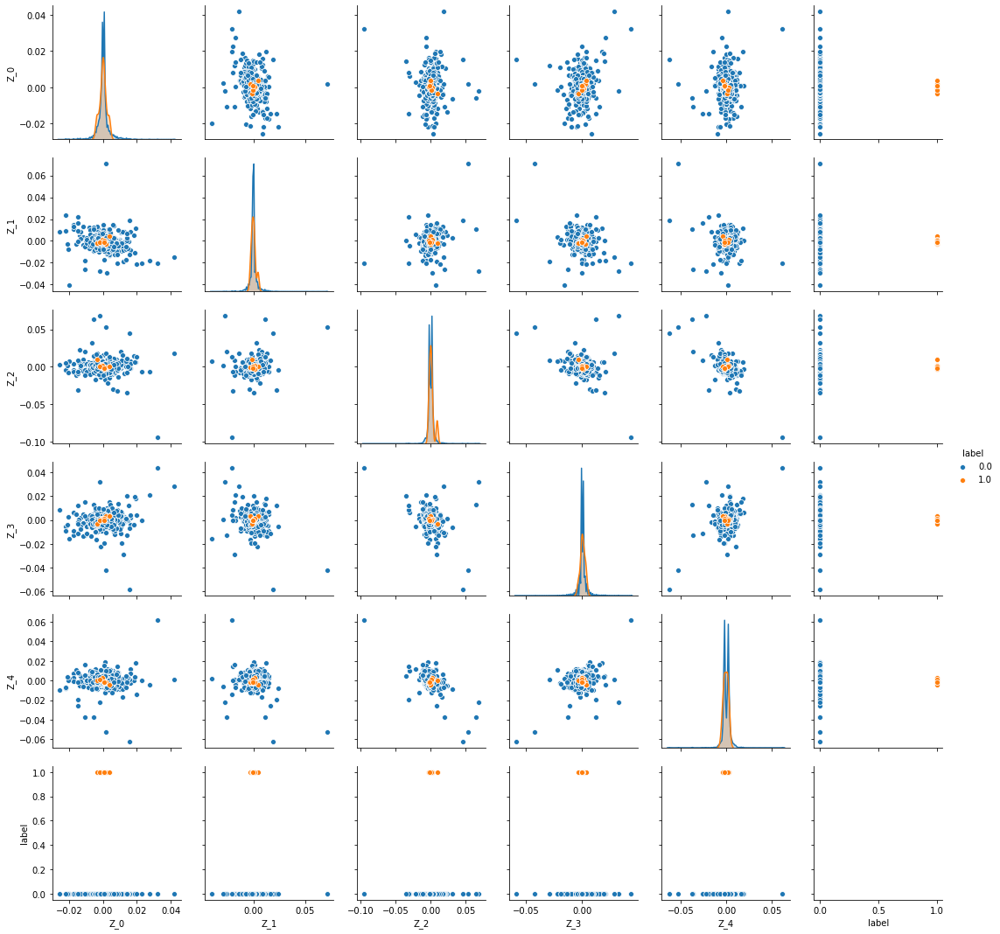

In [21]:
plot_label_clusters_vae(vae_st.encoder, X_val_st, y_val)

In [26]:
reconstructions = vae_st.predict(X_test_st)
vae_mse_st = np.mean(np.power(X_test_st - reconstructions, 2), axis=1)

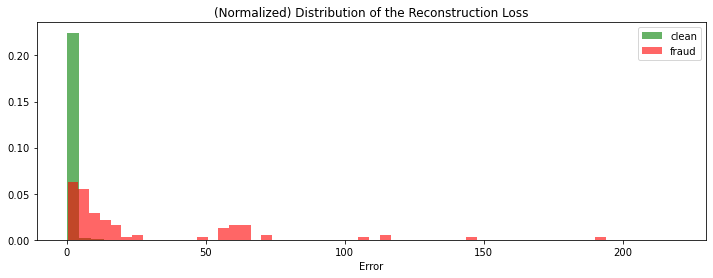

In [27]:
clean = vae_mse_st[y_test==0]
fraud = vae_mse_st[y_test==1]

fig, ax = plt.subplots()
ax.hist(clean, bins=50, density=True, label="clean", alpha=.6, color="green")
ax.hist(fraud, bins=50, density=True, label="fraud", alpha=.6, color="red")

plt.title("(Normalized) Distribution of the Reconstruction Loss")
plt.xlabel('Error')
plt.legend()
plt.show()

In [28]:
scores_vae_st = np.mean(np.power(X_test_st - vae_st.predict(X_test_st)[1], 2), axis=1)
fpr, tpr, thresholds = metrics.roc_curve(np.array(y_test), scores_vae_st, pos_label=1)
metrics.auc(fpr, tpr)

0.9629093547942531

In [29]:
df_pf_vae_st = performance_rank_df(y_test, scores_vae_st, if_score = False)
performance_rank_n(df_pf_vae_st)

,Precision,Recall,F1_score
Rank,,,
100,0.2500,0.255102,0.252525
500,0.1040,0.530612,0.173913
1000,0.0720,0.734694,0.131148
10000,0.0092,0.938776,0.018221


# VAE with MinMaxScaler pre-processing

In [32]:
%%time
vae_mm = build_vae_model(
    encoder_neurons = [20,10],
    decoder_neurons = [10,20],
    latent_dim=5,
    hidden_activation='tanh',
    output_activation='sigmoid',
    learning_rate=0.00001,
    loss = tf.losses.binary_crossentropy)

vae_mm_history = fit_vae_model(
    vae_mm,
    name= 'vae_mm',
    X_train=X_train_mm[y_train == 0],
    validation_data=(X_val_mm[y_val == 0], X_val_mm[y_val == 0])
    )


Epoch 1/50
6397/6397 [==============================] - 29s 4ms/step - loss: 1.4134 - val_loss: 0.8341
Epoch 2/50
6397/6397 [==============================] - 23s 4ms/step - loss: 0.7784 - val_loss: 0.6782
Epoch 3/50
6397/6397 [==============================] - 26s 4ms/step - loss: 0.6630 - val_loss: 0.6276
Epoch 4/50
6397/6397 [==============================] - 25s 4ms/step - loss: 0.6218 - val_loss: 0.6090
Epoch 5/50
6397/6397 [==============================] - 21s 3ms/step - loss: 0.6078 - val_loss: 0.6039
Epoch 6/50
6397/6397 [==============================] - 19s 3ms/step - loss: 0.6037 - val_loss: 0.6024
Epoch 7/50
6397/6397 [==============================] - 20s 3ms/step - loss: 0.6025 - val_loss: 0.6021
Epoch 8/50
6397/6397 [==============================] - 19s 3ms/step - loss: 0.6022 - val_loss: 0.6019
Epoch 9/50
6397/6397 [==============================] - 19s 3ms/step - loss: 0.6020 - val_loss: 0.6019
Epoch 10/50
6397/6397 [==============================] - 19s 3ms/step - l

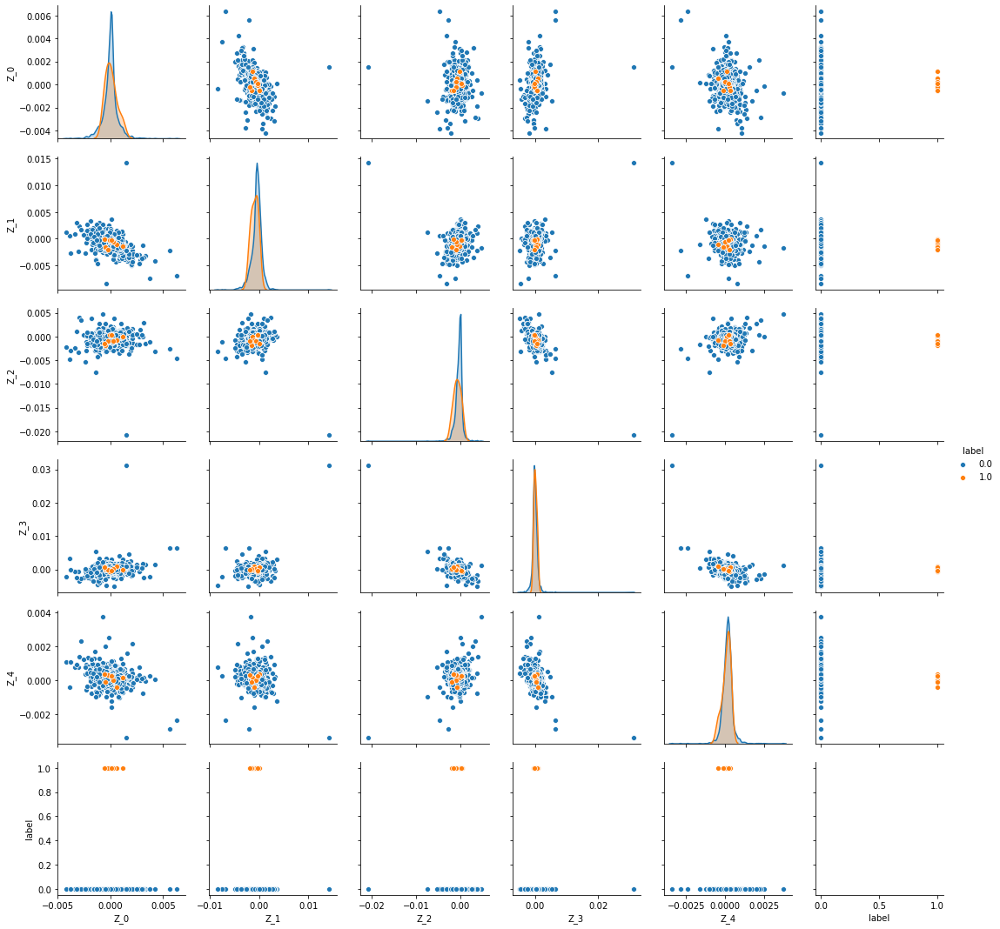

In [33]:
plot_label_clusters_vae(vae_mm.encoder, X_val_mm, y_val)

In [34]:
reconstructions_mm = vae_mm.predict(X_test_mm)
vae_mse_mm = np.mean(np.power(X_test_mm - reconstructions_mm, 2), axis=1)

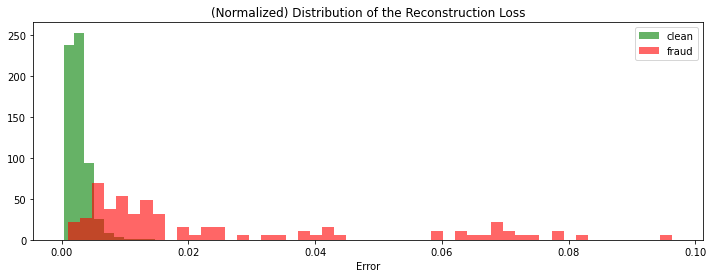

In [35]:
clean = vae_mse_mm[y_test==0]
fraud = vae_mse_mm[y_test==1]

fig, ax = plt.subplots()
ax.hist(clean, bins=50, density=True, label="clean", alpha=.6, color="green")
ax.hist(fraud, bins=50, density=True, label="fraud", alpha=.6, color="red")

plt.title("(Normalized) Distribution of the Reconstruction Loss")
plt.xlabel('Error')
plt.legend()
plt.show()

In [36]:
scores_vae_mm = np.mean(np.power(X_test_mm - vae_mm.predict(X_test_mm)[1], 2), axis=1)
fpr, tpr, thresholds = metrics.roc_curve(np.array(y_test), scores_vae_mm, pos_label=1)
metrics.auc(fpr, tpr)

0.9568047428594398

In [37]:
df_pf_vae_mm = performance_rank_df(y_test, scores_vae_mm, if_score = False)
performance_rank_n(df_pf_vae_mm)

,Precision,Recall,F1_score
Rank,,,
100,0.3800,0.387755,0.383838
500,0.1300,0.663265,0.217391
1000,0.0710,0.724490,0.129326
10000,0.0092,0.938776,0.018221


## Variational Autoencoder reconstruct the mean data point

In [38]:
vae_mm.predict(X_test_mm)

array([[0.9586, 0.7675, 0.9209, ..., 0.2382, 0.3134, 0.311 ],
       [0.9584, 0.7651, 0.9204, ..., 0.238 , 0.3142, 0.3085],
       [0.9582, 0.7665, 0.9207, ..., 0.2388, 0.3141, 0.309 ],
       ...,
       [0.9582, 0.7676, 0.9208, ..., 0.2389, 0.3134, 0.3112],
       [0.9584, 0.7657, 0.9201, ..., 0.2378, 0.3124, 0.3057],
       [0.9583, 0.767 , 0.9203, ..., 0.2387, 0.3134, 0.3102]],
      dtype=float32)

In [39]:
mse_mean = np.mean(np.power(X_train_mm[y_train == 0].mean(axis=0) - X_test_mm, 2), axis=1)
pd.DataFrame(mse_mean - scores_vae_mm).describe()

,0
count,56962.000000
mean,-0.000002
std,0.000033
min,-0.000151
25%,-0.000024
50%,-0.000002
75%,0.000020
max,0.000251
